# Machine Learning Engineer Nanodegree

## Capstone Project

## Project: Write an Algorithm for Distracted Driver Detection

---



>**Note:** Code and Markdown cells can be executed using the **Shift + Enter** keyboard shortcut.  Markdown cells can be edited by double-clicking the cell to enter edit mode.



---

### The Road Ahead

The notebook is broken into separate steps as shown below.

* [Step 0](#step0): Import Datasets
* [Step 1](#step1): Create and train a CNN to Classify Driver Images (from Scratch)
* [Step 2](#step3): Train a CNN with Transfer Learning (Using Fine-tuned VGG16)
* [Step 3](#step4): Kaggle Results




In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import os

import keras
import numpy
from keras.preprocessing.image import ImageDataGenerator

In [ ]:
import keras
import numpy
from keras.preprocessing.image import ImageDataGenerator

<a id="step0"></a>
## Step 0: Import Datasets

### Import Driver Dataset

In the following code cell, we create a instance of ImageDataGenerator which does all preprocessing operations on images that we are going to feed to our CNN

In the following code, we are loading only 32 images at once into memory and performing all the preprocessing operations on loaded images. The flow_from_directory loads a defined set of images from the location of images, instead of loading all images at once into memory.

- train_generator contains training set
- val_generator contains validation set

In [ ]:
from PIL import Image

ac_labels=  ["c0: safe driving",
"c1: texting - right",
"c2: talking on the phone - right",
"c3: texting - left",
"c4: talking on the phone - left",
"c5: operating the radio",
"c6: drinking",
"c7: reaching behind",
"c8: hair and makeup",
"c9: talking to passenger"]


## Dataset Exploration
- Following code block explores and reveals the dataset

## Data Visualization
Following code block. displays images and their respective labels of training/ validation dataset

---
<a id='step1'></a>
## Step 1: Create a CNN to Classify Driver Images (from Scratch)



A CNN is created to classify driver images.  At the end of the code cell block, the layers of the model are summarized by executing the line:
    
        model.summary()

We have created 6 convolutional layers with 1 max pooling layer and 1 GlobalAveragePooling in between. Filters were increased from 8 to 512 in total convolutional layers. Also dropout was used along with Global average pooling layer before using the fully connected layer. Number of nodes in the last fully connected layer were setup as 10 along with softmax activation function. ReLU activation function was used for all other layers.

6 convolutional layers were used to learn hierarchy of high level features. Max pooling layer is added to reduce the dimensionality. Global Average Pooling layer is added to reduce the dimensionality as well as the matrix to row vector. This is because fully connected layer only accepts row vector. Dropout layers were added to reduce overfitting and ensure that the network generalizes well. The last fully connected layer with softmax activation function is added to obtain probabilities of the prediction.


In [ ]:
from keras.layers import ZeroPadding2D, Conv2D, MaxPooling2D, Flatten, Dense, Dropout, Input
from keras.layers import GlobalAveragePooling2D, MaxPooling2D
from keras.models import Model, Sequential
from keras.callbacks import ModelCheckpoint
from keras import regularizers

In [ ]:
input_layer = Input(shape=(224,224, 3))

conv = Conv2D(filters=8, kernel_size=2)(input_layer)
conv = Conv2D(filters=16, kernel_size=2, activation='relu')(conv)
conv = Conv2D(filters=32, kernel_size=2, activation='relu')(conv)
conv = MaxPooling2D()(conv)

conv = Conv2D(filters=64, kernel_size=2, activation='relu')(conv)
conv = Conv2D(filters=128, kernel_size=2, activation='relu')(conv)
conv = Conv2D(filters=512, kernel_size=2, activation='relu')(conv)

conv = GlobalAveragePooling2D()(conv)
dense = Dense(units=500, activation='relu')(conv)
dense = Dropout(0.1)(dense)
dense = Dense(units=100, activation='relu')(dense)
dense = Dropout(0.1)(dense)
output = Dense(units=10, activation='softmax')(dense)

model = Model(inputs=input_layer, outputs = output)

In [ ]:
model.summary()

Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_8 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 conv2d_12 (Conv2D)          (None, 223, 223, 8)       104       
                                                                 
 conv2d_13 (Conv2D)          (None, 222, 222, 16)      528       
                                                                 
 conv2d_14 (Conv2D)          (None, 221, 221, 32)      2080      
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 110, 110, 32)      0         
 g2D)                                                            
                                                                 
 conv2d_15 (Conv2D)          (None, 109, 109, 64)      8256      
                                                           

### Compile CNN from scratch Model

### (IMPLEMENTATION) Train the Model

The model is trained in the code cell below. Model checkpointing is used to save the model that attains the best validation loss.


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


- In the following code block, we are plotting the loss value of training and validation to see whether the model is learning or not

#### Loading test dataset into memory and predict on test images
- Following code block contains a method, that loads all test images into memory by batches, each batch with 32 images when it is called each time

In [ ]:
!unzip '/content/New folder.zip'

Archive:  /content/New folder.zip
  inflating: New folder/img_1.jpg    
  inflating: New folder/img_10.jpg   
  inflating: New folder/img_100.jpg  
  inflating: New folder/img_1000.jpg  
  inflating: New folder/img_100000.jpg  
  inflating: New folder/img_100001.jpg  
  inflating: New folder/img_100002.jpg  
  inflating: New folder/img_100003.jpg  
  inflating: New folder/img_100004.jpg  
  inflating: New folder/img_100005.jpg  
  inflating: New folder/img_100007.jpg  
  inflating: New folder/img_100008.jpg  
  inflating: New folder/img_100009.jpg  
  inflating: New folder/img_10001.jpg  


In [ ]:


import os
model.load_weights('/content/best_model_1.hdf5')
#Test Images
batch_index = 0
files_list = os.listdir("/content/New folder/")
def load_test_images(batch_size=5, src='/content/New folder/'):
    global batch_index, files_list
    imgs_list = files_list[batch_index: batch_index+batch_size]
    batch_index += len(imgs_list)
    batch_imgs = []
    for img_name in imgs_list:
        img = Image.open(src+img_name)
        im = img.resize((224,224))
        batch_imgs.append(np.array(im)/255.)
        #plt.imshow()
        plt.show()
    return np.array(batch_imgs)


- Following code block predicts on test images by loading 32 images a batch using load_test_images function

In [ ]:
#Test Images write
import sys
preds_list = np.array([])
batch_index=0
batch_size = 1
while True:
    tst_imgs = load_test_images(batch_size=batch_size)
    if(tst_imgs.shape[0] <= 0  ):
        print("Batchsize is less : ",batch_index)
        break
    preds = model.predict(tst_imgs)
    print("\r {},  batch_size : {}, nth_batch/all_batch : {}/{}".format(preds_list.shape,batch_size, batch_index, len(files_list)),end="")
    sys.stdout.flush()
    if len(preds_list) == 0:
        preds_list = np.array(preds)
    else:
        preds_list = np.append(preds_list, preds, axis=0)


1/1 [==============================] - 0s 30ms/step
 (13, 10),  batch_size : 1, nth_batch/all_batch : 14/14Batchsize is less :  14


## Convert the predicted output to submittable output file

In [ ]:
titles = "img,c0,c1,c2,c3,c4,c5,c6,c7,c8,c9".split(",")
names = pd.DataFrame(files_list[:len(preds_list)])
names.columns=["img"]
df = pd.DataFrame(preds_list)
df.columns=titles[1:]
df['img']=names['img']
df = df[titles]
df.tail()
df.to_csv('sub.csv',index=False)


## Predictions by scratch CNN on some sample images
- Seems like the predictions are not so accurate because of less training

img    img_100004.jpg
c0           0.126229
c1           0.100623
c2            0.09855
c3           0.106889
c4           0.102602
c5            0.11457
c6           0.095823
c7           0.085478
c8           0.077326
c9           0.091909
Name: 0, dtype: object

label :  c0: safe driving


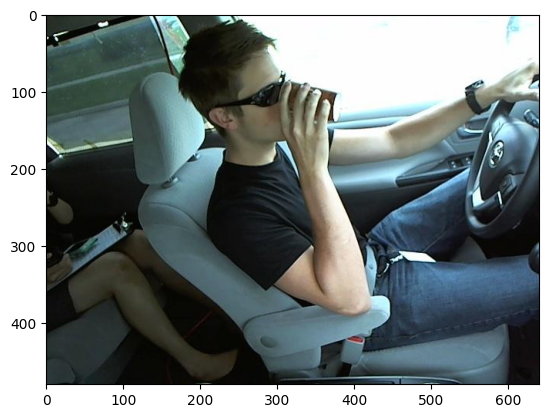

img    img_100008.jpg
c0           0.151774
c1           0.091945
c2             0.0895
c3           0.110906
c4           0.105749
c5           0.128189
c6           0.079764
c7           0.077784
c8           0.067054
c9           0.097335
Name: 1, dtype: object

label :  c0: safe driving


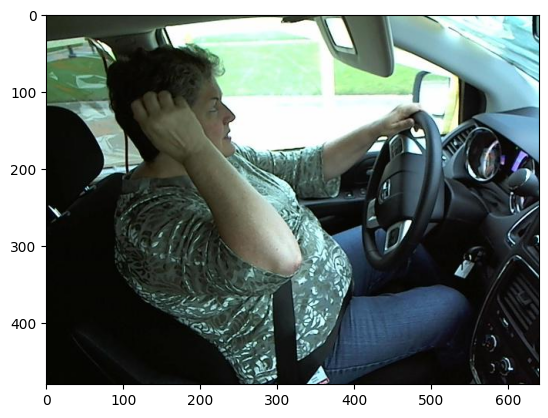

img    img_100005.jpg
c0           0.148591
c1           0.092723
c2           0.090831
c3           0.110802
c4           0.105169
c5           0.126626
c6           0.081013
c7           0.079041
c8           0.068387
c9           0.096818
Name: 2, dtype: object

label :  c0: safe driving


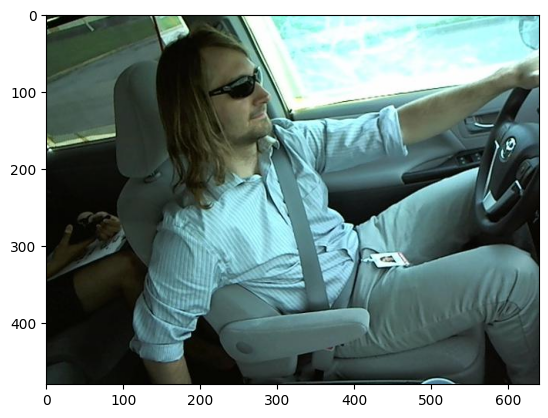

img    img_100007.jpg
c0           0.150298
c1           0.092327
c2           0.090072
c3           0.110862
c4            0.10552
c5           0.127556
c6           0.080265
c7           0.078368
c8           0.067626
c9           0.097107
Name: 3, dtype: object

label :  c0: safe driving


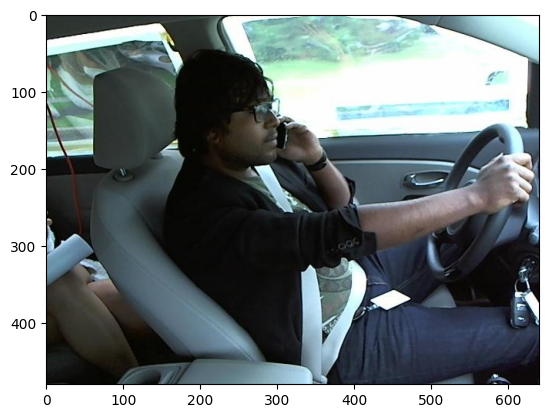

img    img_100003.jpg
c0           0.156748
c1           0.090747
c2            0.08774
c3            0.11108
c4           0.106376
c5           0.130243
c6           0.078116
c7           0.075897
c8           0.065153
c9             0.0979
Name: 4, dtype: object

label :  c0: safe driving


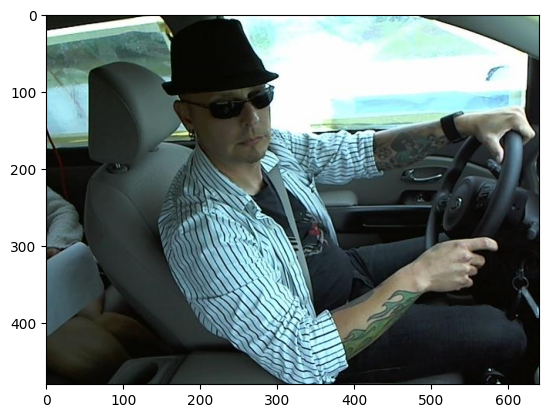

img    img_100002.jpg
c0           0.152843
c1           0.091668
c2           0.089087
c3           0.110933
c4           0.105914
c5           0.128641
c6           0.079405
c7           0.077365
c8           0.066645
c9             0.0975
Name: 5, dtype: object

label :  c0: safe driving


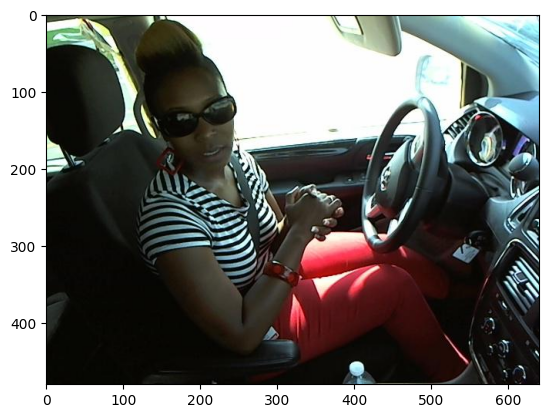

img    img_100001.jpg
c0             0.1588
c1           0.090322
c2           0.087211
c3           0.111281
c4            0.10642
c5           0.131196
c6           0.077407
c7           0.075153
c8           0.064273
c9           0.097938
Name: 6, dtype: object

label :  c0: safe driving


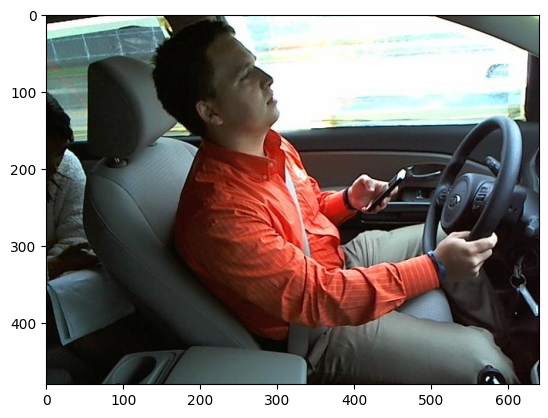

img    img_1000.jpg
c0         0.145918
c1         0.093666
c2         0.092034
c3         0.110357
c4         0.104643
c5         0.125107
c6         0.082528
c7         0.080019
c8         0.069642
c9         0.096086
Name: 7, dtype: object

label :  c0: safe driving


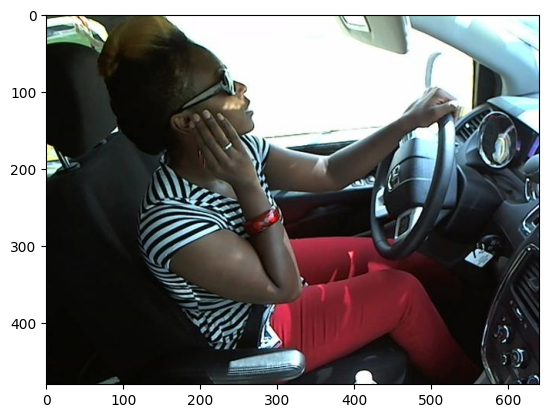

img    img_1.jpg
c0      0.152977
c1      0.091635
c2      0.089039
c3      0.110937
c4      0.105935
c5      0.128693
c6      0.079361
c7      0.077311
c8      0.066593
c9      0.097517
Name: 8, dtype: object

label :  c0: safe driving


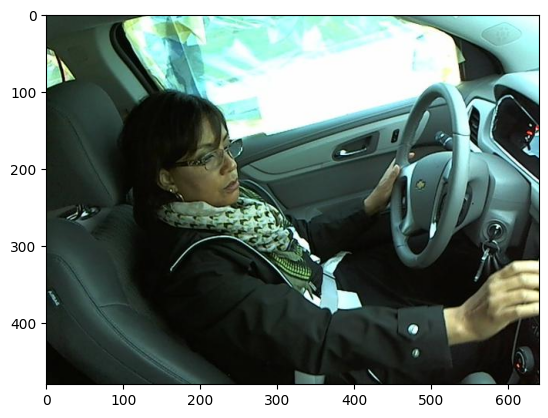

img    img_100000.jpg
c0           0.157894
c1           0.090514
c2           0.087446
c3           0.111188
c4           0.106403
c5           0.130769
c6           0.077721
c7           0.075483
c8           0.064666
c9           0.097916
Name: 9, dtype: object

label :  c0: safe driving


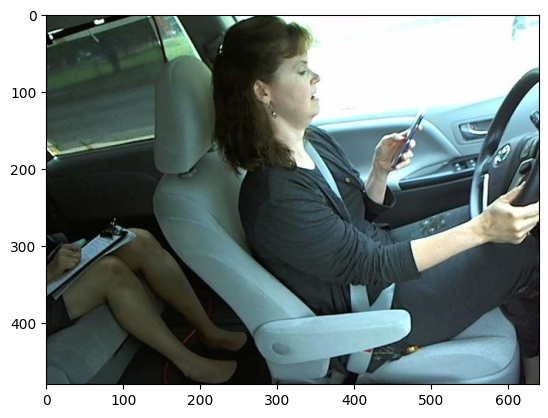

img    img_10001.jpg
c0          0.160287
c1          0.090007
c2          0.086826
c3          0.111423
c4          0.106439
c5          0.131906
c6          0.076888
c7          0.074615
c8          0.063635
c9          0.097973
Name: 10, dtype: object

label :  c0: safe driving


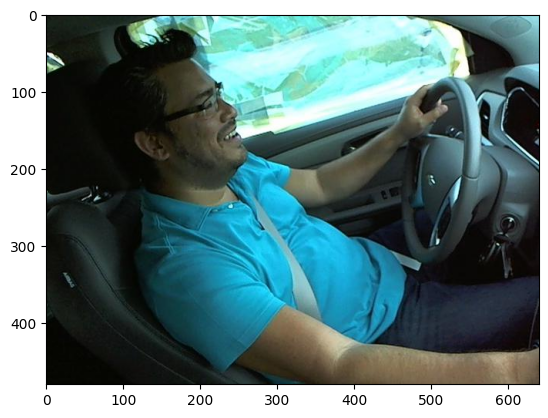

img    img_10.jpg
c0       0.158683
c1       0.090348
c2       0.087243
c3       0.111267
c4       0.106419
c5       0.131137
c6       0.077449
c7       0.075195
c8       0.064325
c9       0.097934
Name: 11, dtype: object

label :  c0: safe driving


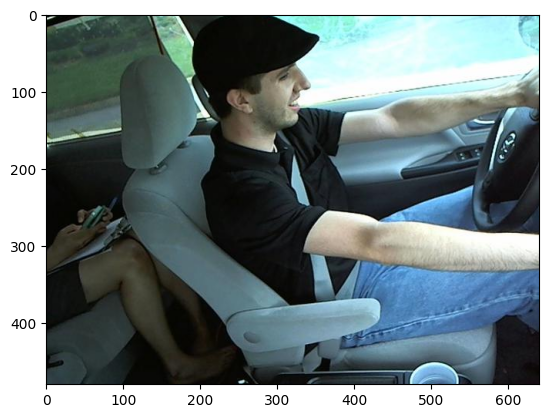

img    img_100.jpg
c0        0.160226
c1        0.090021
c2        0.086841
c3        0.111416
c4        0.106439
c5        0.131879
c6        0.076908
c7        0.074637
c8        0.063662
c9        0.097971
Name: 12, dtype: object

label :  c0: safe driving


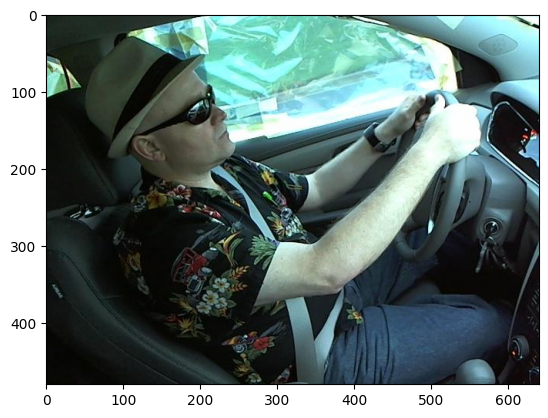

img    img_100009.jpg
c0           0.145841
c1           0.093694
c2            0.09207
c3           0.110344
c4           0.104629
c5           0.125061
c6           0.082572
c7           0.080047
c8           0.069679
c9           0.096063
Name: 13, dtype: object

label :  c0: safe driving


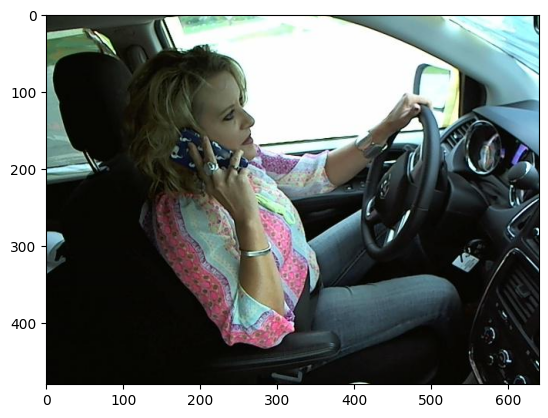

In [ ]:
indices = [0,1,2,3,4,5,6,7,8,9,10,11,12,13]
for index in indices:
    display(df.iloc[index])
    cls = np.argmax(list(df.iloc[index][:]))
    print("label : ",ac_labels[cls])
    im_test = Image.open('/content/New folder/'+df.iloc[index]['img'])
    plt.imshow(np.array(im_test))
    plt.show()

---
<a id="step2"></a>
##  Step 2: Train a CNN with Transfer Learning (Using Fine-tuned VGG16 Model)

- In the following steps, we are going to load a VGG16 model, without top Fully connected layers, with its trained weights
- Then we are going add Fully Connected Layers on top of GlobalAveragePooling layer with Dropout layers in between
- The following code block contains a method load_VGG16, which loads VGG16 model with weights loaded when weights file location is given

In [ ]:

def load_VGG16(weights_path=None, no_top=True):

    input_shape = (224, 224, 3)

    #Instantiate an empty model
    img_input = Input(shape=input_shape)   # Block 1
    x = Conv2D(64, (3, 3), activation='relu', padding='same', name='block1_conv1')(img_input)
    x = Conv2D(64, (3, 3), activation='relu', padding='same', name='block1_conv2')(x)
    x = MaxPooling2D((2, 2), strides=(2, 2), name='block1_pool')(x)

    # Block 2
    x = Conv2D(128, (3, 3), activation='relu', padding='same', name='block2_conv1')(x)
    x = Conv2D(128, (3, 3), activation='relu', padding='same', name='block2_conv2')(x)
    x = MaxPooling2D((2, 2), strides=(2, 2), name='block2_pool')(x)

    # Block 3
    x = Conv2D(256, (3, 3), activation='relu', padding='same', name='block3_conv1')(x)
    x = Conv2D(256, (3, 3), activation='relu', padding='same', name='block3_conv2')(x)
    x = Conv2D(256, (3, 3), activation='relu', padding='same', name='block3_conv3')(x)
    x = MaxPooling2D((2, 2), strides=(2, 2), name='block3_pool')(x)

    # Block 4
    x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block4_conv1')(x)
    x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block4_conv2')(x)
    x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block4_conv3')(x)
    x = MaxPooling2D((2, 2), strides=(2, 2), name='block4_pool')(x)

    # Block 5
    x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block5_conv1')(x)
    x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block5_conv2')(x)
    x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block5_conv3')(x)
    x = MaxPooling2D((2, 2), strides=(2, 2), name='block5_pool')(x)
    x = GlobalAveragePooling2D()(x)
    vmodel = Model(img_input, x, name='vgg16')
    if weights_path is not None:
        print("Weights have been loaded.")
        vmodel.load_weights(weights_path)

    return vmodel


- In the following code block, we have added 3 Dense layers with dropout layers on top of VGG16 CNN model.

In [ ]:
vgg_model_raw = load_VGG16()

vgg_model = vgg_model_raw.output
#vgg_model = Flatten()(vgg_model)
vgg_model = Dense(5000, activation='relu',kernel_regularizer=regularizers.l2(0.00001))(vgg_model)
#vgg_model = Dropout(0.1)(vgg_model)
#vgg_model = Dense(1000, activation='relu')(vgg_model)
vgg_model = Dropout(0.1)(vgg_model)
vgg_model = Dense(500, activation='relu',kernel_regularizer=regularizers.l2(0.00001))(vgg_model)
vgg_model = Dropout(0.1)(vgg_model)
vgg_model = Dense(10, activation='softmax')(vgg_model)
vgg_m = Model(inputs=vgg_model_raw.input, outputs= vgg_model)

In [ ]:
vgg_m.layers[16].get_weights()

[array([[[[-2.53370628e-02,  4.85022552e-03, -4.37639095e-03, ...,
           -2.29938142e-02, -5.26413135e-03, -2.51352359e-02],
          [-1.25925960e-02, -2.15350389e-02,  6.46395609e-04, ...,
            3.81391495e-04,  2.02073492e-02, -1.93876028e-02],
          [ 8.07385892e-03,  5.99132106e-03, -2.28660405e-02, ...,
           -7.10305758e-03,  1.11569092e-02,  4.94281389e-03],
          ...,
          [-4.06340696e-03, -7.57269375e-03,  1.04051977e-02, ...,
            3.37664038e-04, -2.16078330e-02, -2.34623626e-02],
          [-1.07857240e-02,  1.77516490e-02,  2.35421024e-03, ...,
            4.27018851e-03,  2.20643431e-02,  1.22008584e-02],
          [ 1.38485506e-02,  1.53024122e-02, -1.07983053e-02, ...,
           -7.10902736e-04, -1.85287148e-02,  1.35960802e-02]],
 
         [[ 2.28139423e-02,  2.73093022e-03, -5.72746620e-03, ...,
            1.62562355e-02,  2.38026977e-02, -1.18884454e-02],
          [-9.53208655e-05, -2.07041837e-02,  2.28061602e-02, ...,
     

### Compile the vgg16 model with categorical crossentropy as loss function and SGD as optimizer

In [ ]:
vgg_m.summary()

Model: "model_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_9 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0   

- Create a Checkpoint to save best weights, when loss in improvised
- Train the model for 6 epochs

- Following method gives a batch of 32 images at each call, just like a generator

In [ ]:

import os
model.load_weights('/content/best_model_1.hdf5')
#Test Images
batch_index = 0
#files_lst = os.listdir("../input/state-farm-distracted-driver-detection/test")
files_list = os.listdir("/content/New folder")
def load_test_images(batch_size=32, src='/content/New folder/'):
    global batch_index, files_list
    imgs_list = files_list[batch_index: batch_index+batch_size]
    batch_index += len(imgs_list)
    batch_imgs = []
    for img_name in imgs_list:
        img = Image.open(src+img_name)
        im = img.resize((224,224))
        batch_imgs.append(np.array(im)/255.)
#     plt.imshow()
        plt.show()
    return np.array(batch_imgs)


In [ ]:
#Test Images write
import sys
preds_list = np.array([])
batch_index=0
batch_size = 1

mm_raw = load_VGG16()

mm_model = mm_raw.output
mm_model = Dense(5000, activation='relu',kernel_regularizer=regularizers.l2(0.00001))(mm_model)
mm_model = Dropout(0.1)(mm_model)
mm_model = Dense(500, activation='relu',kernel_regularizer=regularizers.l2(0.00001))(mm_model)
mm_model = Dropout(0.1)(mm_model)
mm_model = Dense(10, activation='softmax')(mm_model)
#mm = Model(inputs=vgg_model_raw.input, outputs= vgg_model)
mm = Model(inputs=vgg_model_raw.input, outputs= vgg_model)

mm.load_weights('/content/vgg_model.h5')



while True:
    tst_imgs = load_test_images(batch_size=batch_size)
    if(tst_imgs.shape[0] <= 0  ):
        print("Batchsize is less : ",batch_index)
        break
    preds = mm.predict(tst_imgs)
    print("\r {},  batch_size : {}, nth_batch/all_batch : {}/{}".format(preds_list.shape,batch_size, batch_index, len(files_list)),end="")
    sys.stdout.flush()
    if len(preds_list) == 0:
        preds_list = np.array(preds)
    else:
        preds_list = np.append(preds_list, preds, axis=0)


1/1 [==============================] - 0s 17ms/step
 (13, 10),  batch_size : 1, nth_batch/all_batch : 14/14Batchsize is less :  14


In [ ]:

titles = "img,c0,c1,c2,c3,c4,c5,c6,c7,c8,c9".split(",")
names = pd.DataFrame(files_list[:len(preds_list)])
names.columns=["img"]
df = pd.DataFrame(preds_list)
df.columns=titles[1:]
df['img']=names['img']
df = df[titles]
df.tail()

,img,c0,c1,c2,c3,c4,c5,c6,c7,c8,c9
9,img_100000.jpg,0.005401,1.303212e-04,1.417357e-06,9.848405e-01,2.191315e-03,0.000045,7.224374e-05,9.392645e-07,0.004746,0.002572
10,img_10001.jpg,0.000072,1.088662e-07,9.368151e-07,5.151732e-08,3.131271e-07,0.999450,3.822373e-07,7.991796e-07,0.000312,0.000162
11,img_10.jpg,0.000074,9.467818e-06,3.860188e-06,6.398101e-06,1.219246e-05,0.960819,1.781208e-03,7.445163e-04,0.029848,0.006701
12,img_100.jpg,0.077067,2.333555e-02,4.720495e-05,1.368570e-03,1.502260e-04,0.004696,2.238682e-03,6.784032e-04,0.033823,0.856596
13,img_100009.jpg,0.000435,5.781005e-03,7.643095e-01,4.429140e-05,1.073923e-03,0.000548,6.650373e-02,4.349130e-03,0.132037,0.024918


In [ ]:
df.to_csv('sub_VGG16.csv',index=False)

label :  c6: drinking


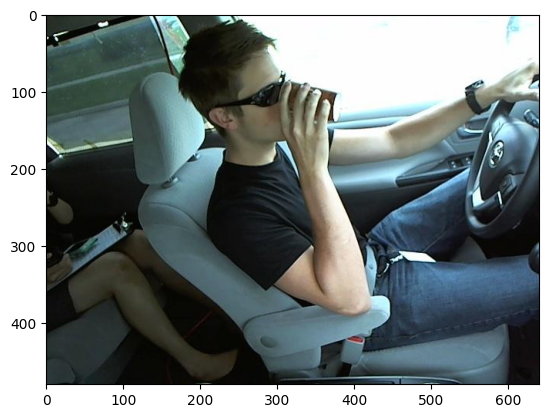

label :  c8: hair and makeup


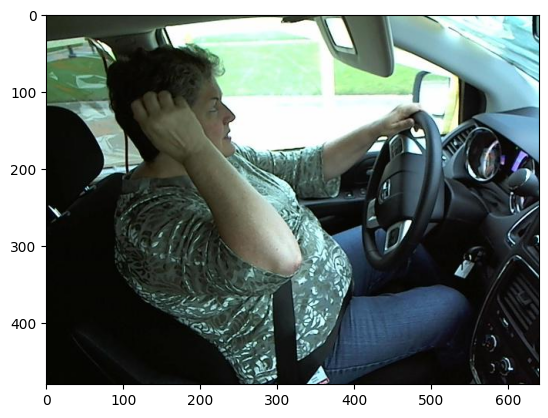

label :  c7: reaching behind


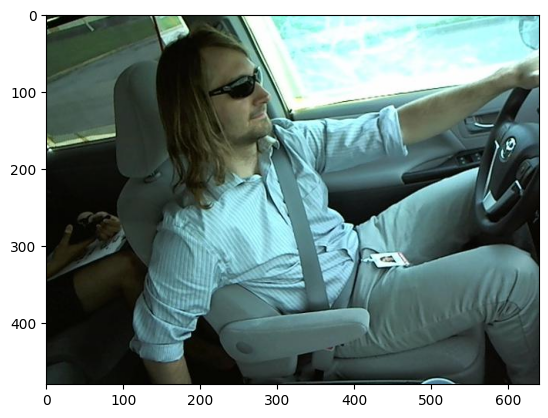

label :  c4: talking on the phone - left


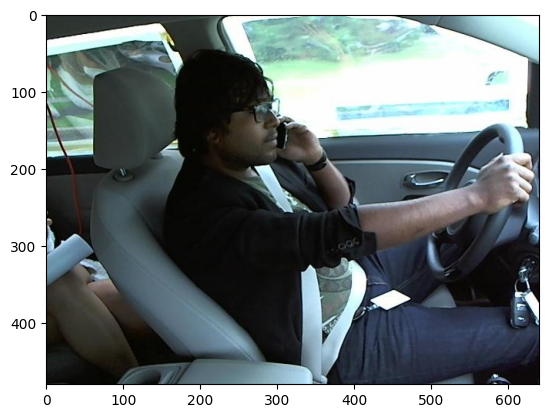

label :  c9: talking to passenger


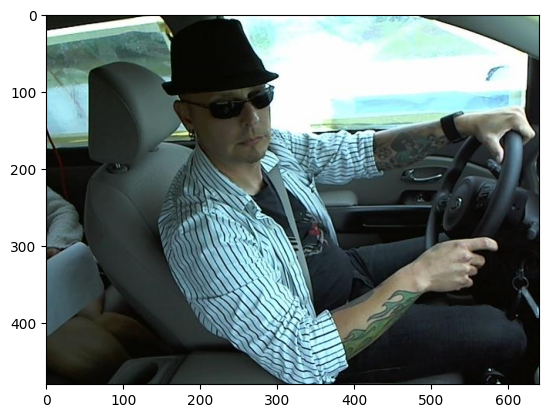

label :  c6: drinking


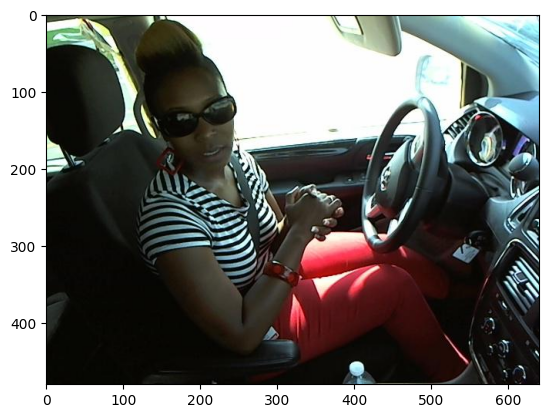

label :  c3: texting - left


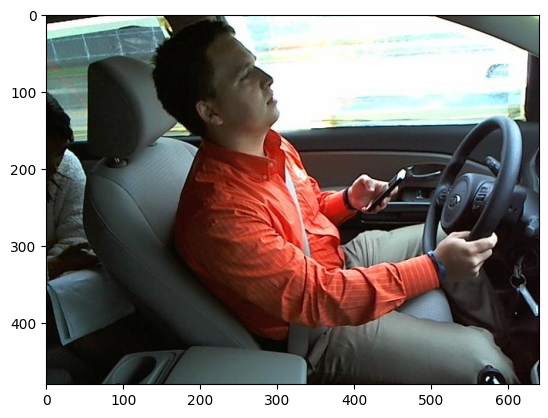

label :  c8: hair and makeup


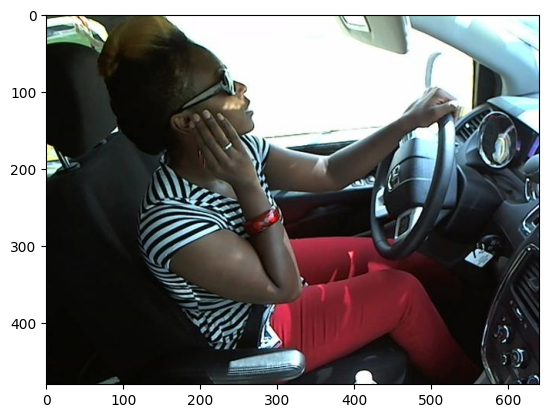

label :  c5: operating the radio


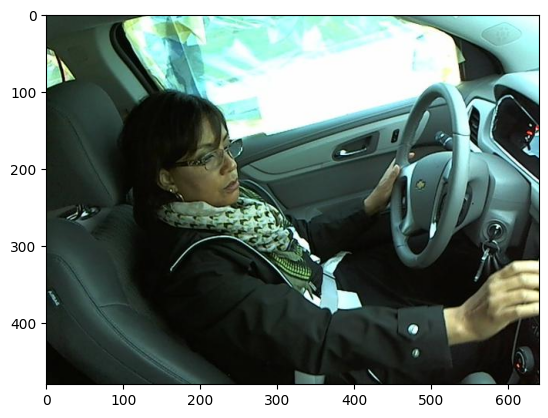

label :  c3: texting - left


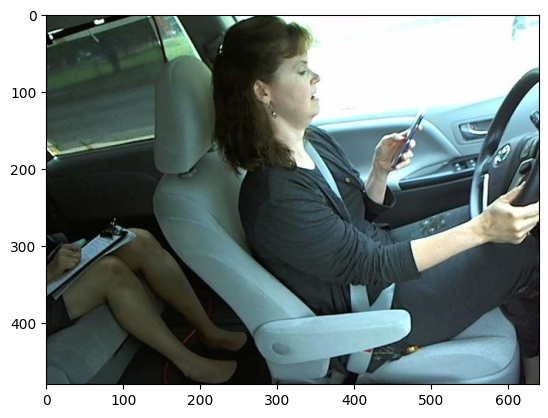

label :  c5: operating the radio


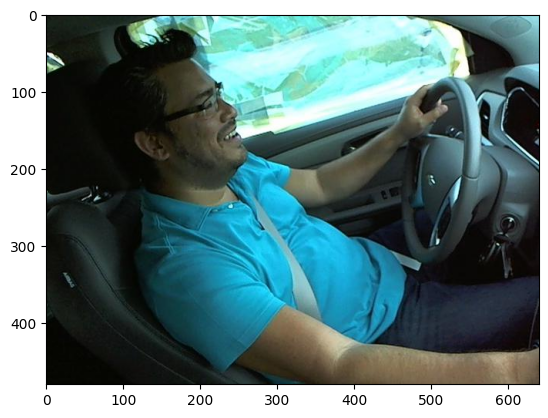

label :  c5: operating the radio


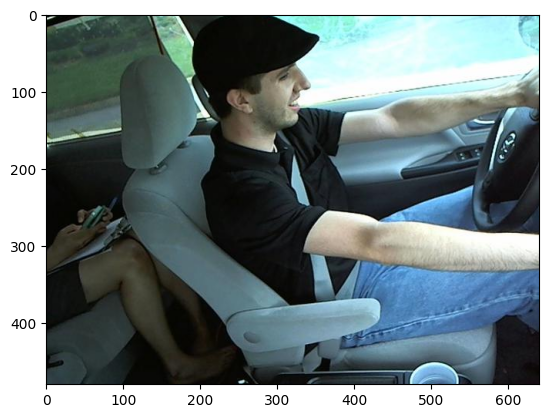

label :  c9: talking to passenger


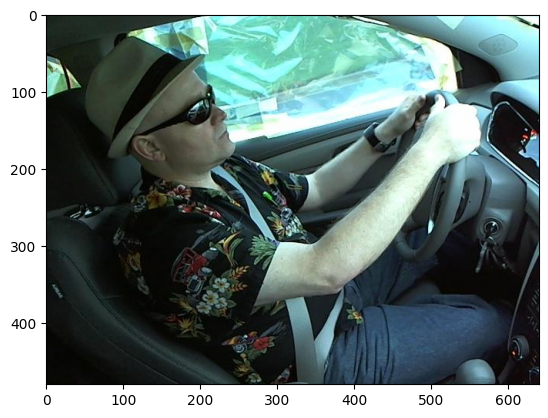

label :  c2: talking on the phone - right


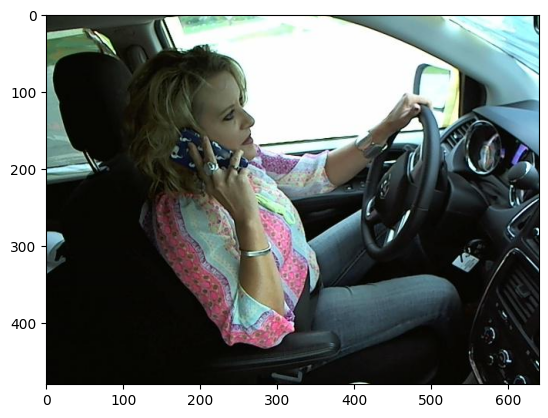

In [ ]:
indices = [0,1,2,3,4,5,6,7,8,9,10,11,12,13]
for index in indices:
#     display(df.iloc[index])
    cls = np.argmax(list(df.iloc[index][1:]))
    print("label : ",ac_labels[cls])
    im_test = Image.open('/content/New folder/'+df.iloc[index]['img'])
    plt.imshow(np.array(im_test))
    plt.show()


In [ ]:
!cat sub_VGG16.csv | head -10

img,c0,c1,c2,c3,c4,c5,c6,c7,c8,c9
img_53062.jpg,1.3752409e-06,5.9887112e-05,0.0013237337,4.9716928e-06,3.874444e-06,4.6278008e-05,0.9794113,3.4503446e-05,0.018972734,0.00014119172
img_56784.jpg,0.006001437,0.0011534869,2.5682614e-06,0.98151785,0.00036721036,5.47825e-05,2.4660989e-05,1.1320462e-06,0.0018264569,0.009050409
img_66669.jpg,0.00016196581,5.176415e-06,3.0080494e-06,0.0008249078,0.9723722,4.1450157e-06,3.8380854e-06,1.2881472e-07,0.0030207492,0.023603948
img_90863.jpg,0.00022194399,0.0009181548,0.0025868325,3.9699744e-06,3.7927293e-05,0.036372084,0.020175427,0.084073946,0.5223042,0.33330548
img_84366.jpg,0.8723474,0.0042686425,2.1146026e-05,0.00023742659,0.00056938437,0.0003270593,6.8831905e-06,5.249188e-05,0.0022750918,0.119894475
img_50632.jpg,0.39195246,0.0041730865,2.4775307e-05,2.3536833e-05,0.0013794515,0.002587291,3.1228672e-05,0.000515782,0.0008669004,0.5984455
img_72077.jpg,0.0059521217,0.00020409643,2.4996603e-05,6.0149337e-06,0.00018555918,0.0034505695,2.4748657e-05